<a href="https://colab.research.google.com/github/RANJITHROSAN17/GroundingDino/blob/main/GROUNDING_DINO_AUTO_LABEL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd GroundingDINO
!git checkout -q 57535c5a79791cb76e36fdb64975271354f10251
!pip install -q -e .

Cloning into 'GroundingDINO'...
remote: Enumerating objects: 401, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 401 (delta 52), reused 44 (delta 44), pack-reused 324
Receiving objects: 100% (401/401), 12.84 MiB | 28.41 MiB/s, done.
Resolving deltas: 100% (205/205), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 35.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.2 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip uninstall -y supervision
!pip install -q supervision==0.4.0

import supervision as svn
print(svn.__version__)

Found existing installation: supervision 0.4.0
Uninstalling supervision-0.4.0:
  Successfully uninstalled supervision-0.4.0
0.4.0


In [ ]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join("groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))
!mkdir -p weights
%cd weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
import os
%cd /content/GroundingDINO
GROUNDING_DINO_CHECKPOINT_PATH = os.path.join("weights/groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True
/content/GroundingDINO/weights
/content/GroundingDINO
weights/groundingdino_swint_ogc.pth ; exist: True


In [ ]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


In [ ]:
!mkdir -p data

In [ ]:
!unzip /content/drive/MyDrive/test.zip -d /content/GroundingDINO/data

Archive:  /content/drive/MyDrive/test.zip
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_10.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_11.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_12.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_13.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_14.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_15.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_16.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_17.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_18.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_19.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_2.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082023_rr_20.jpg  
  inflating: /content/GroundingDINO/data/test/synergy_27082

In [ ]:
SOURCE_IMAGE_PATH = "/content/GroundingDINO/data/test/synergy_27082023_rr_10.jpg"
CLASSES = ['person','helmet','vibrocharger'] #add the class name to be labeled automatically
BOX_TRESHOLD = 0.34
TEXT_TRESHOLD = 0.15

Detections(xyxy=array([[ 198.20734, 1168.9397 ,  341.5976 , 1560.7817 ],
       [1020.47705, 1312.6692 , 1185.102  , 1814.6431 ],
       [ 233.03961, 1170.1282 ,  316.94153, 1256.1577 ],
       [1038.8534 , 1312.5001 , 1163.5817 , 1412.6119 ],
       [ 400.09473,  919.6759 , 2219.6094 , 1742.5643 ]], dtype=float32), class_id=array([0, 0, 1, 1, 2]), confidence=array([0.7925366 , 0.819656  , 0.6645986 , 0.6611821 , 0.35645947],
      dtype=float32), tracker_id=None) ____________________________


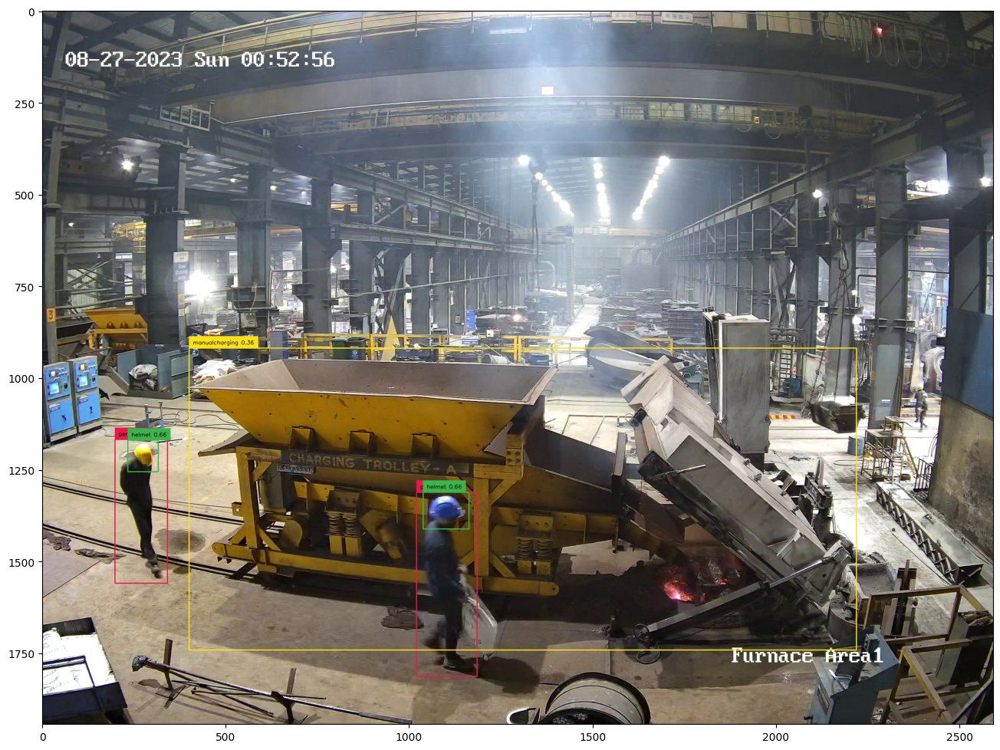

In [ ]:
from typing import List

def enhance_class_name(class_names: List[str]) -> List[str]:
   return [
       f"all {class_name}s"
       for class_name
       in class_names
   ]
import cv2
import supervision as sv

# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_classes(
   image=image,
   classes=enhance_class_name(class_names=CLASSES),
   box_threshold=BOX_TRESHOLD,
   text_threshold=TEXT_TRESHOLD
)

# annotate image with detections
box_annotator = svn.BoxAnnotator()
print(detections,"____________________________")
labels = [f"{CLASSES[class_id]} {confidence:0.2f}"
   for _, confidence, class_id, _
in detections]
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

%matplotlib inline
svn.plot_image(annotated_frame, (16, 16))

In [ ]:
import os

IMAGES_DIRECTORY = "./data/test"
IMAGES_EXTENSIONS = ['jpg', 'jpeg', 'png']

CLASSES = ['person','helmet']
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.15

In [ ]:
import cv2
from tqdm.notebook import tqdm

images = {}
annotations = {}

image_paths = svn.list_files_with_extensions(
   directory=IMAGES_DIRECTORY,
   extensions=IMAGES_EXTENSIONS)

for image_path in tqdm(image_paths):
   image_name = image_path.name
   image_path = str(image_path)
   image = cv2.imread(image_path)

   detections = grounding_dino_model.predict_with_classes(
       image=image,
       classes=enhance_class_name(class_names=CLASSES),
       box_threshold=BOX_TRESHOLD,
       text_threshold=TEXT_TRESHOLD
   )
   detections = detections[detections.class_id != None]
   images[image_name] = image
   annotations[image_name] = detections

  0%|          | 0/47 [00:00<?, ?it/s]

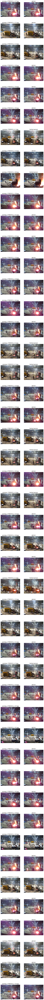

In [ ]:
plot_images = []
plot_titles = []

box_annotator = svn.BoxAnnotator()
mask_annotator = svn.MaskAnnotator()

for image_name, detections in annotations.items():
   image = images[image_name]
   plot_images.append(image)
   plot_titles.append(image_name)

   labels = [
       f"{CLASSES[class_id]} {confidence:0.2f}"
       for _, _, confidence, class_id, _
       in detections]
   annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
   annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
   plot_images.append(annotated_image)
   title = " ".join(set([
       CLASSES[class_id]
       for class_id
       in detections.class_id
   ]))
   plot_titles.append(title)

svn.plot_images_grid(images=plot_images, titles=plot_titles, grid_size=(len(annotations), 2), size=(2 * 4, len(annotations) * 4))

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
%cd /content/GroundingDINO
!mkdir annotations

/content/GroundingDINO


In [ ]:

ANNOTATIONS_DIRECTORY = "/content/GroundingDINO/annotations"

MIN_IMAGE_AREA_PERCENTAGE = 0.002
MAX_IMAGE_AREA_PERCENTAGE = 0.80
APPROXIMATION_PERCENTAGE = 0.75
svn.Dataset(
   classes=CLASSES,
   images=images,
   annotations=annotations
).as_pascal_voc(
   annotations_directory_path=ANNOTATIONS_DIRECTORY,
   min_image_area_percentage=MIN_IMAGE_AREA_PERCENTAGE,
   max_image_area_percentage=MAX_IMAGE_AREA_PERCENTAGE,
   approximation_percentage=APPROXIMATION_PERCENTAGE
)

In [ ]:
!zip -r /content/GroundingDINO/annotations.zip /content/GroundingDINO/annotations

  adding: content/GroundingDINO/annotations/ (stored 0%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_88.xml (deflated 67%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_20.xml (deflated 78%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_72.xml (deflated 80%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_89.xml (deflated 67%)
  adding: content/GroundingDINO/annotations/LA2_MG_KR_83.xml (deflated 37%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_15.xml (deflated 80%)
  adding: content/GroundingDINO/annotations/LA2_MG_KR_76.xml (deflated 69%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_93.xml (deflated 67%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_64.xml (deflated 79%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_39.xml (deflated 75%)
  adding: content/GroundingDINO/annotations/LA2_MG_KR_78.xml (deflated 67%)
  adding: content/GroundingDINO/annotations/LA2_MG_NG_56.xml (deflated 78%)
  adding: content/GroundingDINO